#Natural Disaster Midterm

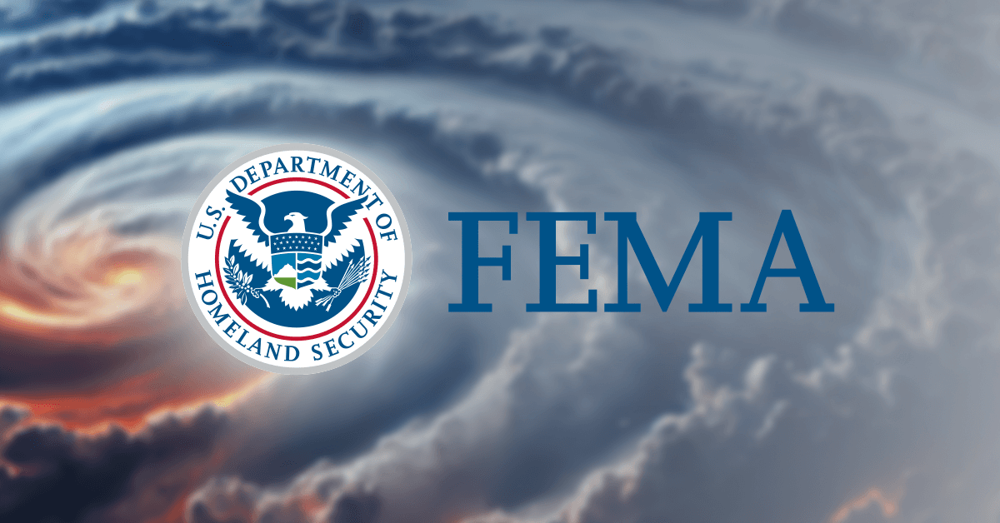

##Introduction

###Links to datasets: <br>https://www.kaggle.com/datasets/headsortails/us-natural-disaster-declarations <br> https://gist.github.com/russellsamora/12be4f9f574e92413ea3f92ce1bc58e6

###What is this dataset?

  This dataset originated from Kaggle. It contains about 60,000 rows and 23 columns. It was an official FEMA dataset that was slightly cleaned an reformatted for easier use. I did, however, need to clean it much further. I joined it with a dataset containing fips codes and their associated latitude/longitude, which after looking on Google maps seems to be the centroid of the county. Here is a list of the meaningful column headings: State, declaration_date, incident_type, declaration_title, ih_program_declared,	ia_program_declared,	pa_program_declared,	hm_program_declared, incident_begin_date, incident_end_date, fips, and designated_area.

  State: State in which the disaster occured or FEMA was called to
  <br>Declaration_date: The date which the disaster was declared by FEMA
  <br>Incident_type: The type of incident that ensued
  <br>Declaration_title: A more specific lable for the incident that ensued
  <br>Ih_program_declared: A column stating if the individuals and households FEMA program was declared
  <br>Ia_program_declared: A column stating if the individual assistance FEMA program was declared
  <br>Pa_program_declared: A column stating if the public assistance FEMA program was declared
  <br>Hm_program_declared: A column stating if the hazard mitigation FEMA program was declared
  <br>Incident_begin_date: The starting date of the incident
  <br>Incident_end_date: The date that the incident ended
  <br>Fips: A code that uniquely identifies each US county
  <br>Designated_area: The US county or county equivilent where the incident occured
###Why this dataset?

  I chose this dataset after learning about several natural disasters in AOR. We just did tsunami day, and I was incredibly saddened with the true distruction these intense disasters bring. After finding this dataset, I knew I wanted to explore all of the ways Federal Emergency Management Agency (FEMA) came to aid in disasters.

###What will I do with this dataset?

####I will research three seperate questions:
  <br>1. Have the number of declarations for FEMA or the length of these declarations increased over the years, maybe associated with the changing climate?
  <br>
  <br>2. What trends do the disasters follow geographicaly? Do certain disasters only occur in very specific parts of the United State?
  <br>
  <br>3. Does the type of disaster determine what assistance programs are provided by FEMA? If so, do these differences make sense?


##Pre-Processing and EDA

In [ ]:
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pwd

/content


In [ ]:
!ls /content/drive/MyDrive/us_disaster_declarations.csv

/content/drive/MyDrive/us_disaster_declarations.csv


In [ ]:
disaster=pd.read_csv("/content/drive/MyDrive/us_disaster_declarations.csv", sep=',')

In [ ]:
disaster.head()

,fema_declaration_string,disaster_number,state,declaration_type,declaration_date,fy_declared,incident_type,declaration_title,ih_program_declared,ia_program_declared,...,incident_end_date,disaster_closeout_date,fips,place_code,designated_area,declaration_request_number,last_ia_filing_date,last_refresh,hash,id
0,DR-1-GA,1,GA,DR,1953-05-02T00:00:00Z,1953,Tornado,Tornado,0,1,...,1953-05-02T00:00:00Z,1954-06-01T00:00:00Z,13000,0,Statewide,53013,NaN,2023-03-18T13:22:03Z,48af1afcc4535aa910ddb5b85eebe047dc703a6b,da5c8f17-c28f-4c41-8e06-fa8efc85aa4a
1,DR-2-TX,2,TX,DR,1953-05-15T00:00:00Z,1953,Tornado,Tornado & Heavy Rainfall,0,1,...,1953-05-15T00:00:00Z,1958-01-01T00:00:00Z,48000,0,Statewide,53003,NaN,2023-03-18T13:22:03Z,6bbba411d294ec521683e36313c8da2992e8a857,b0b41f55-0d77-43ac-898c-3cc4a18231e6
2,DR-3-LA,3,LA,DR,1953-05-29T00:00:00Z,1953,Flood,Flood,0,1,...,1953-05-29T00:00:00Z,1960-02-01T00:00:00Z,22000,0,Statewide,53005,NaN,2023-03-18T13:22:03Z,5b2fa18b404bdcf0d3038cd17f1aa995d5412f48,9fd9401d-c76c-43c3-b42a-6a4ae5139ec0
3,DR-4-MI,4,MI,DR,1953-06-02T00:00:00Z,1953,Tornado,Tornado,0,1,...,1953-06-02T00:00:00Z,1956-02-01T00:00:00Z,26000,0,Statewide,53004,NaN,2023-03-18T13:22:03Z,403164346eb22263810402e8b67f1712f1574ad5,67324f38-1f00-4bbc-aeda-5194d1befad6
4,DR-5-MT,5,MT,DR,1953-06-06T00:00:00Z,1953,Flood,Floods,0,1,...,1953-06-06T00:00:00Z,1955-12-01T00:00:00Z,30000,0,Statewide,53006,NaN,2023-03-18T13:22:03Z,8c775d2ce843a8eba2417f9716ba5c75fe0e53f3,e3853916-c7a2-4557-ad8e-60a42d369a61


In [ ]:
fips=pd.read_csv("/content/drive/MyDrive/us_county_latlng.csv", sep=',')
fips = fips.rename(columns = {'fips_code':'fips'})

In [ ]:
fips.head()

,fips,name,lng,lat
0,1059,Franklin,-87.843283,34.442381
1,13111,Fannin,-84.319296,34.864126
2,19109,Kossuth,-94.206898,43.204140
3,40115,Ottawa,-94.810589,36.835878
4,42115,Susquehanna,-75.800905,41.821277


In [ ]:
total_disaster = pd.merge(disaster, fips, on='fips')

In [ ]:
total_disaster

,fema_declaration_string,disaster_number,state,declaration_type,declaration_date,fy_declared,incident_type,declaration_title,ih_program_declared,ia_program_declared,...,place_code,designated_area,declaration_request_number,last_ia_filing_date,last_refresh,hash,id,name,lng,lat
0,DR-91-IN,91,IN,DR,1959-01-29T00:00:00Z,1959,Flood,Flood,0,1,...,99021,Clay (County),59015,NaN,2023-03-18T13:22:03Z,1fc18a436465efcab902d3966a2fddb4b8e94484,8b0125bc-d09c-4dbb-999f-81bf8ff94205,Clay,-87.115768,39.392918
1,DR-184-OR,184,OR,DR,1964-12-24T00:00:00Z,1965,Flood,Heavy Rains & Flooding,0,1,...,99001,Baker (County),64031,NaN,2023-03-18T13:22:03Z,fdbe0a79e65da920d5dd7f07d11df4d667ee5540,923ec13b-3bf0-438f-ad20-c1a1e4223b5c,Baker,-117.675547,44.709198
2,DR-184-OR,184,OR,DR,1964-12-24T00:00:00Z,1965,Flood,Heavy Rains & Flooding,0,1,...,99003,Benton (County),64031,NaN,2023-03-18T13:22:03Z,0df063f3de4c751d939dafb84a4489319b402166,7f6e1991-2742-4717-9dc1-bfad644a0977,Benton,-123.428743,44.491612
3,DR-184-OR,184,OR,DR,1964-12-24T00:00:00Z,1965,Flood,Heavy Rains & Flooding,0,1,...,99005,Clackamas (County),64031,NaN,2023-03-18T13:22:03Z,d3e91df269a2edb1c3a8dfbd66050717ca57e7c6,aca5c556-c3e8-4747-b809-13a31c59b901,Clackamas,-122.220554,45.188204
4,DR-184-OR,184,OR,DR,1964-12-24T00:00:00Z,1965,Flood,Heavy Rains & Flooding,0,1,...,99007,Clatsop (County),64031,NaN,2023-03-18T13:22:03Z,6d59db3b364faeb25bc194e40a642fdece3b37e7,65fb89a8-8463-4ee9-953c-2baa5287882a,Clatsop,-123.656029,45.995003
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62493,DR-4696-ME,4696,ME,DR,2023-03-22T00:00:00Z,2023,Severe Storm,Severe Storm And Flooding,0,0,...,99031,"York (County)(in MSA 6400,6450)",23013,NaN,2023-03-23T22:31:41Z,c6ed4ead7fd3bee8113ef15d9110e845c56a8b2f,3bd84f66-74d0-4e4a-9287-2414fda89014,York,-70.714316,43.478291
62494,DR-4697-MS,4697,MS,DR,2023-03-26T00:00:00Z,2023,Severe Storm,"Severe Storms, Straight-Line Winds, And Tornadoes",1,0,...,99015,Carroll (County),23025,2023-05-25T00:00:00Z,2023-03-26T06:41:23Z,9ccd8b25b2e64d4e44a043b1da61f3c42e2d02a9,764fa617-efd9-44c4-9d4a-c48e972b485c,Carroll,-89.920311,33.448845
62495,DR-4697-MS,4697,MS,DR,2023-03-26T00:00:00Z,2023,Severe Storm,"Severe Storms, Straight-Line Winds, And Tornadoes",1,0,...,99053,Humphreys (County),23025,2023-05-25T00:00:00Z,2023-03-26T06:41:23Z,62d6f324279680dbb6b1eb2ce91a9bf5ae964e24,c9300696-062b-430f-9f9d-3ad6b1562779,Humphreys,-90.526848,33.128570
62496,DR-4697-MS,4697,MS,DR,2023-03-26T00:00:00Z,2023,Severe Storm,"Severe Storms, Straight-Line Winds, And Tornadoes",1,0,...,99095,Monroe (County),23025,2023-05-25T00:00:00Z,2023-03-26T06:41:23Z,5cb6b2789fc77375f0a1d0e1a8898a1ce3dfc952,df697ed2-4c59-4d02-84e7-d4e84d6e2723,Monroe,-88.480371,33.892285


In [ ]:
disaster.shape

(64092, 23)

In [ ]:
total_disaster.shape

(62498, 26)

In [ ]:
total_disaster.describe()

,disaster_number,fy_declared,ih_program_declared,ia_program_declared,pa_program_declared,hm_program_declared,fips,place_code,declaration_request_number,lng,lat
count,62498.000000,62498.000000,62498.000000,62498.000000,62498.000000,62498.000000,62498.000000,62498.000000,62498.000000,62498.000000,62498.000000
mean,2569.444254,2004.329387,0.166981,0.270793,0.931630,0.429646,31669.254568,97928.979743,34924.331115,-89.940897,37.029774
std,1401.768846,14.615882,0.372962,0.444373,0.252382,0.495029,16609.580247,8712.122986,35021.803304,15.594819,6.549312
min,91.000000,1959.000000,0.000000,0.000000,0.000000,0.000000,1001.000000,325.000000,3.000000,-171.078109,-14.542124
25%,1311.000000,1997.000000,0.000000,0.000000,1.000000,0.000000,19181.000000,99031.000000,8138.000000,-96.777889,33.386644
50%,3055.000000,2006.000000,0.000000,0.000000,1.000000,0.000000,29229.000000,99075.000000,20012.000000,-89.651905,37.436399
75%,3542.000000,2017.000000,0.000000,1.000000,1.000000,1.000000,46077.000000,99125.000000,74030.000000,-81.809538,41.152257
max,5457.000000,2023.000000,1.000000,1.000000,1.000000,1.000000,78030.000000,99507.000000,99159.000000,145.750910,69.315075


In [ ]:
total_disaster.nunique()

,0
fema_declaration_string,4161
disaster_number,4161
state,56
declaration_type,3
declaration_date,2948
fy_declared,60
incident_type,25
declaration_title,1915
ih_program_declared,2
ia_program_declared,2


In [ ]:
total_disaster.dtypes

,0
fema_declaration_string,object
disaster_number,int64
state,object
declaration_type,object
declaration_date,object
fy_declared,int64
incident_type,object
declaration_title,object
ih_program_declared,int64
ia_program_declared,int64


In [ ]:
total_disaster.isna().sum()

,0
fema_declaration_string,0
disaster_number,0
state,0
declaration_type,0
declaration_date,0
fy_declared,0
incident_type,0
declaration_title,0
ih_program_declared,0
ia_program_declared,0


In [ ]:
total_disaster.drop(['hash', 'id', 'last_refresh', 'disaster_number', 'disaster_closeout_date', 'last_ia_filing_date'], axis = 1, inplace=True)

In [ ]:
total_disaster.drop_duplicates

<bound method DataFrame.drop_duplicates of       fema_declaration_string state declaration_type      declaration_date  \
0                    DR-91-IN    IN               DR  1959-01-29T00:00:00Z   
1                   DR-184-OR    OR               DR  1964-12-24T00:00:00Z   
2                   DR-184-OR    OR               DR  1964-12-24T00:00:00Z   
3                   DR-184-OR    OR               DR  1964-12-24T00:00:00Z   
4                   DR-184-OR    OR               DR  1964-12-24T00:00:00Z   
...                       ...   ...              ...                   ...   
62493              DR-4696-ME    ME               DR  2023-03-22T00:00:00Z   
62494              DR-4697-MS    MS               DR  2023-03-26T00:00:00Z   
62495              DR-4697-MS    MS               DR  2023-03-26T00:00:00Z   
62496              DR-4697-MS    MS               DR  2023-03-26T00:00:00Z   
62497              DR-4697-MS    MS               DR  2023-03-26T00:00:00Z   

       fy_declared incident_type  \
0             1959         Flood   
1             1965         Flood   
2             1965         Flood   
3             1965         Flood   
4             1965         Flood   
...            ...           ...   
62493         2023  Severe Storm   
62494         2023  Severe Storm   
62495         2023  Severe Storm   
62496         2023  Severe Storm   
62497         2023  Severe Storm   

                                       declaration_title  ih_program_declared  \
0                                                  Flood                    0   
1                                 Heavy Rains & Flooding                    0   
2                                 Heavy Rains & Flooding                    0   
3                                 Heavy Rains & Flooding                    0   
4                                 Heavy Rains & Flooding                    0   
...                                                  ...                  ...   
62493                          Severe Storm And Flooding                    0   
62494  Severe Storms, Straight-Line Winds, And Tornadoes                    1   
62495  Severe Storms, Straight-Line Winds, And Tornadoes                    1   
62496  Severe Storms, Straight-Line Winds, And Tornadoes                    1   
62497  Severe Storms, Straight-Line Winds, And Tornadoes                    1   

       ia_program_declared  pa_program_declared  hm_program_declared  \
0                        1                    1                    0   
1                        1                    1                    0   
2                        1                    1                    0   
3                        1                    1                    0   
4                        1                    1                    0   
...                    ...                  ...                  ...   
62493                    0                    1                    1   
62494                    0                    1                    1   
62495                    0                    1                    1   
62496                    0                    1                    1   
62497                    0                    1                    1   

        incident_begin_date     incident_end_date   fips  place_code  \
0      1959-01-29T00:00:00Z  1959-01-29T00:00:00Z  18021       99021   
1      1964-12-24T00:00:00Z  1964-12-24T00:00:00Z  41001       99001   
2      1964-12-24T00:00:00Z  1964-12-24T00:00:00Z  41003       99003   
3      1964-12-24T00:00:00Z  1964-12-24T00:00:00Z  41005       99005   
4      1964-12-24T00:00:00Z  1964-12-24T00:00:00Z  41007       99007   
...                     ...                   ...    ...         ...   
62493  2022-12-23T00:00:00Z  2022-12-24T00:00:00Z  23031       99031   
62494  2023-03-24T00:00:00Z  2023-03-25T00:00:00Z  28015       99015   
62495  2023-03-24T00:00:00Z  2023-03-25T00:00:00Z  28053       99053   
62496  2023-03-24T00:00:00Z  

In [ ]:
total_disaster.shape

(62498, 20)

In [ ]:
total_disaster['state'].value_counts()

,count
state,
TX,5061
MO,2699
KY,2579
VA,2493
LA,2471
OK,2364
FL,2278
GA,2270
NC,2072


Texas has a lot of FEMA declarations!

In [ ]:
total_disaster['incident_type'].value_counts()

,count
incident_type,
Severe Storm,17320
Hurricane,12949
Flood,10468
Biological,7226
Snowstorm,3693
Fire,3298
Severe Ice Storm,2939
Tornado,1553
Drought,1258


Severe storms are the most common declaration incident type.

In [ ]:
!pip install ydata_profiling --user

In [ ]:
total_disaster.shape

(62498, 20)

In [ ]:
total_disaster = total_disaster[total_disaster['fy_declared'] != '2023']
#I beleive the 2023 year was incomplete in this dataset, and is not represenative of the data

In [ ]:
from ydata_profiling import ProfileReport

profile = ProfileReport(total_disaster)

In [ ]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 20/20 [00:07<00:00,  2.77it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
total_disaster.isna().sum()

,0
fema_declaration_string,0
state,0
declaration_type,0
declaration_date,0
fy_declared,0
incident_type,0
declaration_title,0
ih_program_declared,0
ia_program_declared,0
pa_program_declared,0


Yay! My columns are free of null values and are ready to take on the next challenge!!!

#First Column: Disaster Length in Days

In [ ]:
from datetime import datetime

In [ ]:
def new_time(row):
  if type(row['incident_end_date']) == float:
    return 'T00:00:00Z'
  else:
    return row['incident_end_date'][10::]

total_disaster['incident_end_time'] = total_disaster.apply(new_time, axis = 1)

This was just for fun. I wanted to see if the times that were stated in the data were actually true. It turns out, they really dont matter!

In [ ]:
total_disaster['incident_end_time'].describe()

,incident_end_time
count,62498
unique,1
top,T00:00:00Z
freq,62498


In [ ]:
total_disaster.drop('incident_end_time', axis = 1, inplace = True)

This shows to me that only the beginning numbers in the date have any significance, as the time for every date collected is midnight.

In [ ]:

def new_date(row):
  if type(row['incident_begin_date']) == float:
    return '0000-00-00'
  else:
    return row['incident_begin_date'][0:10]

total_disaster['new_incident_begin_date'] = total_disaster.apply(new_date, axis = 1)
total_disaster


total_disaster.dropna
total_disaster.shape

def new_date2(row):
  if type(row['incident_end_date']) == float:
    return '0000-00-00'
  else:
   return row['incident_end_date'][0:10]

total_disaster['new_incident_end_date'] = total_disaster.apply(new_date2, axis = 1)
total_disaster
pd.set_option('display.max_columns', None)


total_disaster = total_disaster[total_disaster['new_incident_end_date'] != '0000-00-00']
total_disaster

def new_new_date(row):
   return datetime.strptime(row['new_incident_end_date'], "%Y-%m-%d") - datetime.strptime(row['new_incident_begin_date'], "%Y-%m-%d")

total_disaster['number_of_days'] = total_disaster.apply(new_new_date, axis = 1)
total_disaster.shape

/tmp/ipython-input-980059315.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_disaster['number_of_days'] = total_disaster.apply(new_new_date, axis = 1)


(54729, 23)

#Second Column: Disaster Location by Climate Zone
###Categorized by https://www.ncei.noaa.gov/access/monitoring/reference-maps/us-climate-regions

In [ ]:
def assign_zones(row):
  if row['state'] in ['CT','DE', 'ME', 'MD' , 'MA' , 'NH' , 'NJ' , 'NY' , 'PA' , 'RI' , 'VT']:
    return 'Northeast'
  elif row['state'] in ['IA' , 'MI' , 'MN' , 'WI']:
    return 'Upper Midwest'
  elif row['state'] in ['IL' , 'IN' , 'KY' , 'MO' , 'OH' , 'TN' , 'WV']:
    return 'Ohio Valley'
  elif row['state'] in ['AL' , 'FL' , 'GA' , 'NC' , 'SC' , 'VA', 'DC']:
    return 'Southeast'
  elif row['state'] in ['MT' , 'NE' , 'ND' , 'SD' , 'WY']:
    return 'Northern Rockies and Plains'
  elif row['state'] in ['AR' , 'LA' , 'MS' , 'OK' , 'TX' , 'KS']:
    return 'South'
  elif row['state'] in ['AZ' , 'CO' , 'NM' , 'UT']:
    return 'Southwest'
  elif row['state'] in ['ID' , 'OR' , 'WA']:
    return 'Northwest'
  elif row['state'] in ['CA' , 'NV']:
    return 'West'
  elif row['state'] in ['AK']:
    return 'Alaska'
  elif row['state'] in ['HI']:
    return 'Hawaii'
  elif row['state'] in ['PR']:
    return 'Puerto Rico'
  else:
    return 'Other'

total_disaster['zones'] = total_disaster.apply(assign_zones, axis = 1)

/tmp/ipython-input-941230626.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_disaster['zones'] = total_disaster.apply(assign_zones, axis = 1)


This is going to be useful for analyzing geographic trends of disasters within the United States. I expect to see geographic variation

In [ ]:
total_disaster

,fema_declaration_string,state,declaration_type,declaration_date,fy_declared,incident_type,declaration_title,ih_program_declared,ia_program_declared,pa_program_declared,hm_program_declared,incident_begin_date,incident_end_date,fips,place_code,designated_area,declaration_request_number,name,lng,lat,new_incident_begin_date,new_incident_end_date,number_of_days,zones
0,DR-91-IN,IN,DR,1959-01-29T00:00:00Z,1959,Flood,Flood,0,1,1,0,1959-01-29T00:00:00Z,1959-01-29T00:00:00Z,18021,99021,Clay (County),59015,Clay,-87.115768,39.392918,1959-01-29,1959-01-29,0 days,Ohio Valley
1,DR-184-OR,OR,DR,1964-12-24T00:00:00Z,1965,Flood,Heavy Rains & Flooding,0,1,1,0,1964-12-24T00:00:00Z,1964-12-24T00:00:00Z,41001,99001,Baker (County),64031,Baker,-117.675547,44.709198,1964-12-24,1964-12-24,0 days,Northwest
2,DR-184-OR,OR,DR,1964-12-24T00:00:00Z,1965,Flood,Heavy Rains & Flooding,0,1,1,0,1964-12-24T00:00:00Z,1964-12-24T00:00:00Z,41003,99003,Benton (County),64031,Benton,-123.428743,44.491612,1964-12-24,1964-12-24,0 days,Northwest
3,DR-184-OR,OR,DR,1964-12-24T00:00:00Z,1965,Flood,Heavy Rains & Flooding,0,1,1,0,1964-12-24T00:00:00Z,1964-12-24T00:00:00Z,41005,99005,Clackamas (County),64031,Clackamas,-122.220554,45.188204,1964-12-24,1964-12-24,0 days,Northwest
4,DR-184-OR,OR,DR,1964-12-24T00:00:00Z,1965,Flood,Heavy Rains & Flooding,0,1,1,0,1964-12-24T00:00:00Z,1964-12-24T00:00:00Z,41007,99007,Clatsop (County),64031,Clatsop,-123.656029,45.995003,1964-12-24,1964-12-24,0 days,Northwest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62493,DR-4696-ME,ME,DR,2023-03-22T00:00:00Z,2023,Severe Storm,Severe Storm And Flooding,0,0,1,1,2022-12-23T00:00:00Z,2022-12-24T00:00:00Z,23031,99031,"York (County)(in MSA 6400,6450)",23013,York,-70.714316,43.478291,2022-12-23,2022-12-24,1 days,Northeast
62494,DR-4697-MS,MS,DR,2023-03-26T00:00:00Z,2023,Severe Storm,"Severe Storms, Straight-Line Winds, And Tornadoes",1,0,1,1,2023-03-24T00:00:00Z,2023-03-25T00:00:00Z,28015,99015,Carroll (County),23025,Carroll,-89.920311,33.448845,2023-03-24,2023-03-25,1 days,South
62495,DR-4697-MS,MS,DR,2023-03-26T00:00:00Z,2023,Severe Storm,"Severe Storms, Straight-Line Winds, And Tornadoes",1,0,1,1,2023-03-24T00:00:00Z,2023-03-25T00:00:00Z,28053,99053,Humphreys (County),23025,Humphreys,-90.526848,33.128570,2023-03-24,2023-03-25,1 days,South
62496,DR-4697-MS,MS,DR,2023-03-26T00:00:00Z,2023,Severe Storm,"Severe Storms, Straight-Line Winds, And Tornadoes",1,0,1,1,2023-03-24T00:00:00Z,2023-03-25T00:00:00Z,28095,99095,Monroe (County),23025,Monroe,-88.480371,33.892285,2023-03-24,2023-03-25,1 days,South


In [ ]:
total_disaster['number_of_days'].describe()

,number_of_days
count,54729
mean,22 days 20:35:20.966946226
std,40 days 00:57:30.626642154
min,0 days 00:00:00
25%,2 days 00:00:00
50%,11 days 00:00:00
75%,32 days 00:00:00
max,5117 days 00:00:00


This is interesting how it finds the mean accompanied by hours, minutes, etc.

#Third Column: Number of Programs by Disaster

In [ ]:
total_disaster['number_of_programs_declared'] = total_disaster['ih_program_declared'] +	total_disaster['ia_program_declared'] + total_disaster['pa_program_declared'] + total_disaster['hm_program_declared']

/tmp/ipython-input-2386841857.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_disaster['number_of_programs_declared'] = total_disaster['ih_program_declared'] +	total_disaster['ia_program_declared'] + total_disaster['pa_program_declared'] + total_disaster['hm_program_declared']


This was an easy column, but useful to view.

In [ ]:
pd.DataFrame(total_disaster.groupby('incident_type')['number_of_programs_declared'].mean().sort_values(ascending=False))

,number_of_programs_declared
incident_type,
Severe Storm,2.116917
Typhoon,2.083333
Mud/Landslide,2.031250
Volcanic Eruption,2.020000
Tsunami,2.000000
Dam/Levee Break,1.916667
Flood,1.873861
Tornado,1.856407
Earthquake,1.718750


Severe storms, on average, declare the most programs. This makes sense, as they are also the most common disaster type i nthe United States.

#Fourth Column: Year when the Disaster Took Place

Although there is the fy_declared column, it does not always match up with the year on the incident begin date.

In [ ]:
total_disaster['year'] = total_disaster['new_incident_begin_date'].str[0:4]

/tmp/ipython-input-2995790855.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_disaster['year'] = total_disaster['new_incident_begin_date'].str[0:4]


In [ ]:
total_disaster

,fema_declaration_string,state,declaration_type,declaration_date,fy_declared,incident_type,declaration_title,ih_program_declared,ia_program_declared,pa_program_declared,hm_program_declared,incident_begin_date,incident_end_date,fips,place_code,designated_area,declaration_request_number,name,lng,lat,new_incident_begin_date,new_incident_end_date,number_of_days,zones,number_of_programs_declared,year
0,DR-91-IN,IN,DR,1959-01-29T00:00:00Z,1959,Flood,Flood,0,1,1,0,1959-01-29T00:00:00Z,1959-01-29T00:00:00Z,18021,99021,Clay (County),59015,Clay,-87.115768,39.392918,1959-01-29,1959-01-29,0 days,Ohio Valley,2,1959
1,DR-184-OR,OR,DR,1964-12-24T00:00:00Z,1965,Flood,Heavy Rains & Flooding,0,1,1,0,1964-12-24T00:00:00Z,1964-12-24T00:00:00Z,41001,99001,Baker (County),64031,Baker,-117.675547,44.709198,1964-12-24,1964-12-24,0 days,Northwest,2,1964
2,DR-184-OR,OR,DR,1964-12-24T00:00:00Z,1965,Flood,Heavy Rains & Flooding,0,1,1,0,1964-12-24T00:00:00Z,1964-12-24T00:00:00Z,41003,99003,Benton (County),64031,Benton,-123.428743,44.491612,1964-12-24,1964-12-24,0 days,Northwest,2,1964
3,DR-184-OR,OR,DR,1964-12-24T00:00:00Z,1965,Flood,Heavy Rains & Flooding,0,1,1,0,1964-12-24T00:00:00Z,1964-12-24T00:00:00Z,41005,99005,Clackamas (County),64031,Clackamas,-122.220554,45.188204,1964-12-24,1964-12-24,0 days,Northwest,2,1964
4,DR-184-OR,OR,DR,1964-12-24T00:00:00Z,1965,Flood,Heavy Rains & Flooding,0,1,1,0,1964-12-24T00:00:00Z,1964-12-24T00:00:00Z,41007,99007,Clatsop (County),64031,Clatsop,-123.656029,45.995003,1964-12-24,1964-12-24,0 days,Northwest,2,1964
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62493,DR-4696-ME,ME,DR,2023-03-22T00:00:00Z,2023,Severe Storm,Severe Storm And Flooding,0,0,1,1,2022-12-23T00:00:00Z,2022-12-24T00:00:00Z,23031,99031,"York (County)(in MSA 6400,6450)",23013,York,-70.714316,43.478291,2022-12-23,2022-12-24,1 days,Northeast,2,2022
62494,DR-4697-MS,MS,DR,2023-03-26T00:00:00Z,2023,Severe Storm,"Severe Storms, Straight-Line Winds, And Tornadoes",1,0,1,1,2023-03-24T00:00:00Z,2023-03-25T00:00:00Z,28015,99015,Carroll (County),23025,Carroll,-89.920311,33.448845,2023-03-24,2023-03-25,1 days,South,3,2023
62495,DR-4697-MS,MS,DR,2023-03-26T00:00:00Z,2023,Severe Storm,"Severe Storms, Straight-Line Winds, And Tornadoes",1,0,1,1,2023-03-24T00:00:00Z,2023-03-25T00:00:00Z,28053,99053,Humphreys (County),23025,Humphreys,-90.526848,33.128570,2023-03-24,2023-03-25,1 days,South,3,2023
62496,DR-4697-MS,MS,DR,2023-03-26T00:00:00Z,2023,Severe Storm,"Severe Storms, Straight-Line Winds, And Tornadoes",1,0,1,1,2023-03-24T00:00:00Z,2023-03-25T00:00:00Z,28095,99095,Monroe (County),23025,Monroe,-88.480371,33.892285,2023-03-24,2023-03-25,1 days,South,3,2023


In [ ]:
total_disaster.isna().sum()

,0
fema_declaration_string,0
state,0
declaration_type,0
declaration_date,0
fy_declared,0
incident_type,0
declaration_title,0
ih_program_declared,0
ia_program_declared,0
pa_program_declared,0


#Visualizations

In [ ]:
!pip install jupyter-dash
from dash import Dash
import plotly.express as px
from jupyter_dash import JupyterDash
import dash.dcc as dcc
import dash.html as html
from dash.dependencies import Input, Output

##Disasters over the Years

The top four disasters (severe storms, hurricanes, floods, and snowstorms) will be used for this visualization section to simplify the possibilities and to create a much cleaner visual

In [ ]:

disaster_length_yearly = total_disaster.groupby(['year','incident_type'])['number_of_days'].mean()
disaster_length_yearly = disaster_length_yearly.reset_index()

disaster_length_yearly1 = disaster_length_yearly[disaster_length_yearly['incident_type'] == 'Severe Storm']
disaster_length_yearly1.drop('incident_type', axis = 1, inplace = True)
disaster_length_yearly1.rename(columns={'number_of_days': 'Severe Storm Days'}, inplace=True)


disaster_length_yearly2 = disaster_length_yearly[disaster_length_yearly['incident_type'] == 'Flood']
disaster_length_yearly2.drop('incident_type', axis = 1, inplace = True)
disaster_length_yearly2.rename(columns={'number_of_days': 'Flood Days'}, inplace=True)

disaster_length_yearly3 = disaster_length_yearly[disaster_length_yearly['incident_type'] == 'Hurricane']
disaster_length_yearly3.drop('incident_type', axis = 1, inplace = True)
disaster_length_yearly3.rename(columns={'number_of_days': 'Hurricane Days'}, inplace=True)

disaster_length_yearly4 = disaster_length_yearly[disaster_length_yearly['incident_type'] == 'Snowstorm']
disaster_length_yearly4.drop('incident_type', axis = 1, inplace = True)
disaster_length_yearly4.rename(columns={'number_of_days': 'Snowstorm Days'}, inplace=True)

disaster_length_yearly = pd.merge(disaster_length_yearly1,disaster_length_yearly2, on='year')
disaster_length_yearly = pd.merge(disaster_length_yearly,disaster_length_yearly3, on='year')
disaster_length_yearly = pd.merge(disaster_length_yearly,disaster_length_yearly4, on='year')


disaster_length_yearly['Flood Days'] = disaster_length_yearly['Flood Days'].dt.days
disaster_length_yearly['Hurricane Days'] = disaster_length_yearly['Hurricane Days'].dt.days
disaster_length_yearly['Severe Storm Days'] = disaster_length_yearly['Severe Storm Days'].dt.days
disaster_length_yearly['Snowstorm Days'] = disaster_length_yearly['Snowstorm Days'].dt.days

disaster_length_yearly
fig = px.line(disaster_length_yearly, x='year', y=['Severe Storm Days', 'Hurricane Days', 'Flood Days', 'Snowstorm Days'], template='xgridoff', hover_data=['year'], height=1000)

updatemenu=[
    {
        'direction': 'down',
        'showactive': True
    }
]

for i, trace in enumerate(fig.data):
    if i != 0:
        trace.visible = 'legendonly'
#ChatGPT helped with three lines of code above
fig.update_layout(font_family='Serif')
fig.update_layout(xaxis_title = 'Year', yaxis_title='Mean Disaster Length (days)', font_size=15)
fig.update_layout(updatemenus=updatemenu)
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="YTD",
                     step="year",
                     stepmode="todate"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)
fig.update_traces(customdata=disaster_length_yearly['year'], hovertemplate=('<b>Year: %{customdata}<br>' + '<b>Mean Number of Days Lasted: %{y}'))
fig.update_layout(hoverlabel = dict(font=dict(family='Serif')))
fig.update_layout(legend_title_text='<b>Disaster Type</b>')
fig.update_layout(title_text = '<b>Mean Disaster Lengths From 1979 to 2022</b>', title_x = 0.5)
fig.show()


/tmp/ipython-input-3225733505.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  disaster_length_yearly1.drop('incident_type', axis = 1, inplace = True)
/tmp/ipython-input-3225733505.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  disaster_length_yearly1.rename(columns={'number_of_days': 'Severe Storm Days'}, inplace=True)
/tmp/ipython-input-3225733505.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  disaster_length_yearly2.dr

This is an interactive graph showing the mean length of the top four most common disasters FEMA declared. It does not look like the length of each disaster has changed in any way that can be described by a trend, showing me that the length of each disaster is most likely not significantly changing becuase of climate change. However, it appears that some specific disasters just last longer than others. An example of this is how floods seem to last much longer on average than snowstorms.

In [ ]:
severe_storms = total_disaster[total_disaster['incident_type'] == 'Severe Storm'].groupby(['year']).count()
severe_storms = severe_storms['declaration_request_number']
hurricanes = total_disaster[total_disaster['incident_type'] == 'Hurricane'].groupby(['year']).count()
hurricanes = hurricanes['declaration_request_number']
flood = total_disaster[total_disaster['incident_type'] == 'Flood'].groupby(['year']).count()
flood = flood['declaration_request_number']
snowstorm = total_disaster[total_disaster['incident_type'] == 'Snowstorm'].groupby(['year']).count()
snowstorm = snowstorm['declaration_request_number']

combined_disasters = pd.merge(severe_storms, hurricanes, on='year')
combined_disasters.rename(columns={'declaration_request_number_x': 'Severe Storm Declarations'}, inplace=True)
combined_disasters.rename(columns={'declaration_request_number_y': 'Hurricane Declarations'}, inplace=True)
combined_disasters = pd.merge(combined_disasters, flood, on='year')
combined_disasters.rename(columns={'declaration_request_number': 'Flood Declarations'}, inplace=True)
combined_disasters = pd.merge(combined_disasters, snowstorm, on='year')
combined_disasters.rename(columns={'declaration_request_number': 'Snowstorm Declarations'}, inplace=True)
combined_disasters['Year'] = combined_disasters.index
combined_disasters


,Severe Storm Declarations,Hurricane Declarations,Flood Declarations,Snowstorm Declarations,Year
year,,,,,
1979,71,107,209,27,1979
1984,39,9,131,1,1984
1985,2,73,208,2,1985
1987,11,5,106,9,1987
1990,359,5,326,13,1990
1991,90,41,166,4,1991
1993,225,1,496,770,1993
1995,329,126,82,51,1995
1996,424,239,412,559,1996


In [ ]:
fig = px.line(combined_disasters, x='Year', y='Severe Storm Declarations', template='xgridoff', height=1000)

buttons = [
    {
        'method': 'restyle',
        'label': 'Severe Storms',
        'visible': True,
        'args': [
            {
                'x': [combined_disasters['Year']],
                'y': [combined_disasters['Severe Storm Declarations']],
                'type':'line'
            },
            [0]
        ]
    },
    {
        'method': 'restyle',
        'label': 'Hurricanes',
        'visible': True,
        'args': [
            {
                'x': [combined_disasters['Year']],
                'y': [combined_disasters['Hurricane Declarations']],
                'type':'line'
            },
            [0]
        ]
    },
    {
        'method': 'restyle',
        'label': 'Floods',
        'visible': True,
        'args': [
            {
                'x': [combined_disasters['Year']],
                'y': [combined_disasters['Flood Declarations']],
                'type':'line'
            },
            [0]
        ]
    },
    {
        'method': 'restyle',
        'label': 'Snowstorms',
        'visible': True,
        'args': [
            {
                'x': [combined_disasters['Year']],
                'y': [combined_disasters['Snowstorm Declarations']],
                'type':'line'
            },
            [0]
        ]
    }

]


updatemenu=[
    {
        'buttons': buttons,
        'direction': 'down',
        'showactive': True
    }
]
fig.update_layout(updatemenus=updatemenu)
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="YTD",
                     step="year",
                     stepmode="todate"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)
fig.update_layout(font_family='Serif')
fig.update_layout(xaxis_title = 'Year', yaxis_title='Number of Declarations', font_size=15)
fig.update_traces(customdata=disaster_length_yearly['year'], hovertemplate=('<b>Year: %{customdata}<br>' + '<b>Frequency: %{y}'))
fig.update_layout(hoverlabel = dict(font=dict(family='Serif')))
fig.update_layout(title_text = '<b>FEMA Declaration Frequencies From 1979 to 2022 by Incident Type</b>', title_x = 0.5)
#help from https://plotly.com/python/range-slider/
fig.show()

This is a line chart equipped with a dropdown menu and range selecter. This shart shows the number of declarations of each of the four most common disaster types. Similar to the graph above, it does not show any trend that may suggest certain disasters are coming to be more common. However, other data could be used to invesitgate this in the future. Overall, it shows some weather anomolies from the past 40 years. For example, 1993 shows a super high amount of snowstorm declarations, which could have been due to the 1993 Storm of the Century that decimated the United States. Another one is the massive hurricane spike in 2005, definitely caused by the FEMA declarations for Hurricane Katrina, which existed in a lot of the United States.

##Disasters Across the US

In [ ]:
zones_for_chart = total_disaster.groupby(['zones', 'incident_type'])['fema_declaration_string'].count()
zones_for_chart = zones_for_chart.reset_index()

In [ ]:
fig = px.scatter_geo(total_disaster, lat='lat', lon='lng', color='incident_type', template='seaborn', hover_data={'lat':False, 'lng':False, 'declaration_title':True,'year':True,'designated_area':True}, height=1000)
fig.update_traces(
    hovertemplate=(
        "<b>%{customdata[2]}</b><br>" +
        "Year: %{customdata[3]}<br>" +
        "Designated Area: %{customdata[4]}<br>"
    )
)
fig.update_layout(font_size=20)
#ChatGPT helped me with thr hovertemplate code :(
for i, trace in enumerate(fig.data):
    if i != 0:
        trace.visible = 'legendonly'
#ChatGPT helped me with this code

fig.update_layout(font_family='Serif')
fig.update_layout(
        geo = dict(
            scope='usa',
            projection_type='albers usa',
            showland = True
        ))
#help with this from https://stackoverflow.com/questions/62102834/plotly-zoomed-marker-area

fig.update_layout(legend_title_text='<b>Disaster Type</b>')
fig.update_layout(title_text = '<b>Disasters Across the US</b>', title_x = 0.5)
fig.update_layout(hoverlabel = dict(font=dict(family='Serif')))
fig.show()
#help from https://community.plotly.com/t/hover-text-formatting-background-color-text-color-text-font/4465

This is a map of each disaster type, plotted based on the lat/long values associated with the fips codes. This shows me that some disasters just happen everywhere, like severe storms. Other disasters, however, are extremely regional. Volcanoes are only seen in two states on this map: Washington and Hawaii. Washington is due to the Mt. St. Helens eruption, and Hawaii's Kilauea. This map is also incredibly detailed, and you can see some of the most major disasters in US history, like Hurricane Katrina or the Flint Water crisis. Additionallt,

In [ ]:
zones_for_chart
#the column 'fema daclaration string' is just the counted frequency

,zones,incident_type,fema_declaration_string
0,Alaska,Coastal Storm,2
1,Alaska,Earthquake,12
2,Alaska,Fire,11
3,Alaska,Flood,40
4,Alaska,Freezing,11
...,...,...,...
142,West,Freezing,57
143,West,Hurricane,75
144,West,Severe Storm,349
145,West,Snowstorm,31


In [ ]:
fig = px.bar(zones_for_chart, x='incident_type', y='fema_declaration_string',
                 animation_frame='zones', color='zones', template='xgridoff', height=1000)
fig.update_layout(xaxis={'categoryorder': 'total descending'})
fig['layout'].pop('updatemenus')

frame_max = zones_for_chart.groupby('zones')['fema_declaration_string'].max()
fig.update_layout(xaxis_title='Incident Type', yaxis_title='Frequency', font_size = 20)

fig.update_layout(title_text='Disaster Frequencies in Climate Zones within the US', title_x=0.5,font_family='Serif')

for frame in fig.frames:
    zone_name = frame.name
    max_y = frame_max.loc[zone_name]
    frame.layout.update(yaxis=dict(range=[0, max_y * 1.1]))
fig.update_layout(showlegend=False)
fig.layout.sliders[0].currentvalue.prefix = 'Zone: '
fig.layout.sliders[0].font.size = 25
fig.layout.sliders[0].font.family = 'Serif'
for frame in fig.frames:
    for trace in frame.data:
        trace.hovertemplate = (
            "<b>%{x}</b><br>" +
            "Frequency: %{y}<br>"
        )
fig.update_traces(hovertemplate="<b>%{x}</b><br>"+"Frequency: %{y}<br>")
fig.update_layout(hoverlabel = dict(font=dict(family='Serif')))
#help from https://www.tutorialspoint.com/hover-text-and-formatting-in-python-plotly
fig.show()
#ChatGPT helped me figure out how to dynamically change the scales of the chart within the animation




This is an interactive bar chart of the number of declarations of each disaster type between different climate regions within the United States. This corroborates my previous map, showing to me that certain disasters are incredibly regional. However, most regions still have severe storms. Comparing the Northeast states to the West is very different, having extremely different phenomena.

##Programs

In [ ]:
programs = total_disaster.groupby('incident_type')['ih_program_declared'].sum()
programs = pd.merge(programs, (total_disaster.groupby('incident_type')['ia_program_declared'].sum()), on='incident_type')
programs = pd.merge(programs, (total_disaster.groupby('incident_type')['pa_program_declared'].sum()), on='incident_type')
programs = pd.merge(programs, (total_disaster.groupby('incident_type')['hm_program_declared'].sum()), on ='incident_type')
programs['Incident'] = programs.index
programs
programs['count'] = programs['ia_program_declared'] + programs['ih_program_declared'] + programs['pa_program_declared'] + programs['hm_program_declared']

In [ ]:
programs

,ih_program_declared,ia_program_declared,pa_program_declared,hm_program_declared,Incident,count
incident_type,,,,,,
Chemical,0,0,9,0,Chemical,9
Coastal Storm,0,145,613,69,Coastal Storm,827
Dam/Levee Break,5,0,12,6,Dam/Levee Break,23
Drought,0,56,1253,0,Drought,1309
Earthquake,59,66,180,80,Earthquake,385
Fire,167,335,2643,1038,Fire,4183
Fishing Losses,0,42,0,0,Fishing Losses,42
Flood,618,6383,9698,2836,Flood,19535
Freezing,0,266,37,36,Freezing,339


In [ ]:
programs_new = programs.T
programs_new = programs_new.drop('Incident', axis = 0)
programs_new = programs_new.drop('count', axis = 0)
programs_new = programs_new.T

In [ ]:

programs = programs_new.sum()
programs = programs.reset_index()
programs.columns.to_list()

['index', 0]

In [ ]:
programs_new = pd.DataFrame(total_disaster.groupby(['incident_type'])['ih_program_declared'].sum())
programs_new['program_name'] = 'Individuals & Households'
programs_new.rename(columns={'ih_program_declared':'count'}, inplace=True)
programs_new2 = pd.DataFrame(total_disaster.groupby(['incident_type'])['ia_program_declared'].sum())
programs_new2['program_name'] = 'Indvidual Assistance'
programs_new2.rename(columns={'ia_program_declared':'count'}, inplace=True)
programs_new3 = pd.DataFrame(total_disaster.groupby(['incident_type'])['pa_program_declared'].sum())
programs_new3['program_name'] = 'Public Assistance'
programs_new3.rename(columns={'pa_program_declared':'count'}, inplace=True)
programs_new4 = pd.DataFrame(total_disaster.groupby(['incident_type'])['hm_program_declared'].sum())
programs_new4['program_name'] = 'Hazard Mitigation'
programs_new4.rename(columns={'hm_program_declared':'count'}, inplace=True)
programs_chart_stuff = pd.concat([programs_new,programs_new2,programs_new3,programs_new4])

programs_new = pd.DataFrame(total_disaster.groupby(['incident_type'])['ih_program_declared'].sum())
programs_new['program_name'] = 'Individuals & Households'
programs_new.rename(columns={'count':'ih_program_declared'}, inplace=True)
programs_new2 = pd.DataFrame(total_disaster.groupby(['incident_type'])['ia_program_declared'].sum())
programs_new2['program_name'] = 'Indvidual Assistance'
programs_new2.rename(columns={'count':'ia_program_declared'}, inplace=True)
programs_new3 = pd.DataFrame(total_disaster.groupby(['incident_type'])['pa_program_declared'].sum())
programs_new3['program_name'] = 'Public Assistance'
programs_new3.rename(columns={'count':'pa_program_declared'}, inplace=True)
programs_new4 = pd.DataFrame(total_disaster.groupby(['incident_type'])['hm_program_declared'].sum())
programs_new4['program_name'] = 'Hazard Mitigation'
programs_new4.rename(columns={'count':'hm_program_declared'}, inplace=True)
programs_chart_stuff = pd.concat([programs_new,programs_new2,programs_new3,programs_new4])
programs_new.drop(columns='program_name', axis = 1, inplace=True)
programs_new2.drop(columns='program_name', axis = 1, inplace=True)
programs_new3.drop(columns='program_name', axis = 1, inplace=True)
programs_new4.drop(columns='program_name', axis = 1, inplace=True)
programs_chart_stuff2 = pd.merge(programs_new, programs_new2, on='incident_type')
programs_chart_stuff2 = pd.merge(programs_chart_stuff2, programs_new3, on='incident_type')
programs_chart_stuff2 = pd.merge(programs_chart_stuff2, programs_new4, on='incident_type')
#a lot of this code is for a chart I deleted.

programs_chart_stuff2

,ih_program_declared,ia_program_declared,pa_program_declared,hm_program_declared
incident_type,,,,
Chemical,0,0,9,0
Coastal Storm,0,145,613,69
Dam/Levee Break,5,0,12,6
Drought,0,56,1253,0
Earthquake,59,66,180,80
Fire,167,335,2643,1038
Fishing Losses,0,42,0,0
Flood,618,6383,9698,2836
Freezing,0,266,37,36


In [ ]:
programs_chart_stuff2.reset_index(inplace=True)
fig = px.bar(programs_chart_stuff2, x='incident_type', y='ih_program_declared', barmode='group', template='xgridoff', height=900)
buttons = [
    {
        'method': 'restyle',
        'label': 'Individuals and Households',
        'visible': True,
        'args': [
            {
                'x': [programs_chart_stuff2['incident_type']],
                'y': [programs_chart_stuff2['ih_program_declared']],
                'type':'bar'
            },
            [0]
        ]
    },
    {
        'method': 'restyle',
        'label': 'Individual Assistance',
        'visible': True,
        'args': [
            {
                'x': [programs_chart_stuff2['incident_type']],
                'y': [programs_chart_stuff2['ia_program_declared']],
                'type':'bar'
            },
            [0]
        ]
    },
    {
        'method': 'restyle',
        'label': 'Hazard Mitigation',
        'visible': True,
        'args': [
            {
                'x': [programs_chart_stuff2['incident_type']],
                'y': [programs_chart_stuff2['hm_program_declared']],
                'type':'bar'
            },
            [0]
        ]
    },
    {
        'method': 'restyle',
        'label': 'Public Assistance',
        'visible': True,
        'args': [
            {
                'x': [programs_chart_stuff2['incident_type']],
                'y': [programs_chart_stuff2['pa_program_declared']],
                'type':'bar',
            },
            [0]
        ]
    }
]

fig.update_layout(title_text='Most Common Incidents for Each FEMA Program',font_family='Serif', font_size=15, xaxis_title='Incident Type', yaxis_title='Program Declaration Frequency')
updatemenu=[
    {
        'buttons': buttons,
        'direction': 'down',
        'showactive': True
    }
]
fig.update_traces(hovertemplate='Incident Type: %{x}<br>Frequency: %{y}')
fig.update_layout(updatemenus=updatemenu)

fig.update_layout(xaxis={'categoryorder': 'total descending'})

fig.show()

This is another interactive bar chart, this time showing the frequency of each FEMA assistance program between different incident types. The most commonly enacted program is public assistance, which makes sense as this allocated funds for governments to spend, whether on infrastructure or their people. Another thing that makes sense to me and that I find interesting is the fact that the majority of individual assitance is enacted for floods, most likely due to the damage caused to houses during floods. The money is going to people, not governments, in this case.


##Conclusion

###Question 1:

I learned from this analysis that disaster declaration frequency is not changing in a predicatable manner due to the shifting climate. However, the visuals were extremely helpful in seeing the anomolies within the dataset. For example, I viewed historic disasters in the United States, helping me learn about them. This data can be used to point out these historic disasters and years for educational purposes

###Question 2:

I learned from this analysis that many disasters, especially those relating to weather, are very regional. You would not find an earthquake in the middle of Iowa, but they make sense in California. This analysis is exremely useful in targetting locations that may need future assistance. For example, we may not want to build 7 story homes where hurricanes are common, or avoid certain materials if we know fires are common in an area.

###Question 3:

This analysis helped me learn more about the measures FEMA takes for disaster control. In addition to funding the victims, FEMA also allocates funds to the community for cleanup and for disaster prevention. I also learned that certain events get more specific allocations for these programs. This makes sense, as spending more money to prevent hurricane damage is much more useful than spending money to prevent volcanic eruption damage because they are not as common. These breakdowns can be shared with others so, if they are a victim of a disaster, they would know what to expect in terms of FEMA assisance.

<img src="https://img.msf.org/AssetLink/t0i755gb1cnv0821xg8bu84lf31w60o2.jpg" width='700'>